References

https://www.exxactcorp.com/blog/Deep-Learning/YOLOv5-PyTorch-Tutorial

https://medium.com/@csiitism/image-annotations-normalization-technique-for-yolor-yolo-9e7efc5dc51d

We know the coordinates of annotations are (Xmin, Ymin, Xmax, Ymax)

where,

(Xmin, Ymin)=(X1, Y1)

(Xmax, Ymax)=(X2, Y2).

Normalization Formula,

Normalized(Xmin) = (Xmin+w/2)/Image_Width

Normalized(Ymin) = (Ymin+h/2)/Image_Height

Normalized(w) = w/Image_Width

Normalized(h) = h/Image_Height

In [1]:
import pandas as pd
import os
import numpy as np
import shutil
import ast
from sklearn import model_selection
from tqdm import tqdm
import wandb
from sklearn.model_selection import GroupKFold
from IPython.display import Image, clear_output  # to display images
from os import listdir
from os.path import isfile
from glob import glob
import yaml
# clear_output()

In [2]:
count = 0
for root, folders, filenames in os.walk('/kaggle/input'):
   print(root, folders)

/kaggle/input ['satellite-debris-images-spark-2022']
/kaggle/input/satellite-debris-images-spark-2022 ['labels', 'val', 'test', 'train']
/kaggle/input/satellite-debris-images-spark-2022/labels []
/kaggle/input/satellite-debris-images-spark-2022/val ['val']
/kaggle/input/satellite-debris-images-spark-2022/val/val []
/kaggle/input/satellite-debris-images-spark-2022/test ['test']
/kaggle/input/satellite-debris-images-spark-2022/test/test []
/kaggle/input/satellite-debris-images-spark-2022/train ['train']
/kaggle/input/satellite-debris-images-spark-2022/train/train []


In [3]:
TRAIN_LABELS_PATH = './satellite-spark/labels/train'
VAL_LABELS_PATH = './satellite-spark/labels/val'
TRAIN_IMAGES_PATH = './satellite-spark/images/train'
VAL_IMAGES_PATH = './satellite-spark/images/val'
TEST_IMAGES_PATH = './satellite-spark/test'
External_DIR = '/kaggle/input/satellite-debris-images-spark-2022'

os.makedirs(TRAIN_LABELS_PATH, exist_ok = True)
os.makedirs(VAL_LABELS_PATH, exist_ok = True)
os.makedirs(TRAIN_IMAGES_PATH, exist_ok = True)
os.makedirs(VAL_IMAGES_PATH, exist_ok = True)
os.makedirs(TEST_IMAGES_PATH, exist_ok=True)
# size = 512

In [4]:
TRAIN_DIR = '/kaggle/input/satellite-debris-images-spark-2022/train/train'
VAL_DIR = '/kaggle/input/satellite-debris-images-spark-2022/val/val'
TEST_DIR = '/kaggle/input/satellite-debris-images-spark-2022/test/test'

In [5]:
TRAIN_CSV = '/kaggle/input/satellite-debris-images-spark-2022/labels/train.csv'
VAL_CSV = '/kaggle/input/satellite-debris-images-spark-2022/labels/val.csv'

In [6]:
import os

def count_images_in_folder(folder_path):
    if not os.path.exists(folder_path):
        print(f"The folder {folder_path} does not exist.")
        return
    
    # List all files in the directory
    files = os.listdir(folder_path)
    
    # Filter only image files (assuming they have extensions like .jpg, .png, etc.)
    image_files = [file for file in files if file.endswith(('.jpg', '.jpeg', '.png', '.gif', '.bmp'))]
    
    # Count the number of image files
    num_images = len(image_files)
    
    return num_images

# Count images in each folder
num_train_images = count_images_in_folder(TRAIN_DIR)
num_val_images = count_images_in_folder(VAL_DIR)
num_test_images = count_images_in_folder(TEST_DIR)

# Print the results
print(f"Number of images in TRAIN_DIR: {num_train_images}")
print(f"Number of images in VAL_DIR: {num_val_images}")
print(f"Number of images in TEST_DIR: {num_test_images}")


Number of images in TRAIN_DIR: 66000
Number of images in VAL_DIR: 22000
Number of images in TEST_DIR: 22000


In [7]:
import cv2

# Example image filename
image_filename = 'img000011.jpg'

# Read the image
image = cv2.imread(os.path.join(TRAIN_DIR, image_filename))

# Get image width and height
image_height, image_width, channel = image.shape

print("Image Width:", image_width)
print("Image Height:", image_height)
print("Image Channel:", channel)


Image Width: 1024
Image Height: 1024
Image Channel: 3


In [8]:
df = pd.read_csv(TRAIN_CSV)
df.head()

,filename,class,bbox
0,img086351.png,smart_1,"[183, 311, 657, 415]"
1,img083734.png,smart_1,"[361, 352, 479, 716]"
2,img081317.png,smart_1,"[163, 16, 905, 785]"
3,img089140.png,smart_1,"[188, 427, 499, 573]"
4,img082379.png,smart_1,"[152, 462, 1024, 605]"


In [9]:
import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv(TRAIN_CSV)
countc = 0

# Extract unique classes from the 'class' column along with their counts
unique_classes = df['class'].value_counts()

# Print the list of unique classes and their counts
print("Unique classes and their counts:\n")
for class_name, count in unique_classes.items():
    countc = countc + 1
    print(f"{class_name}: {count}")

print("\nTotal Unique Classes:", countc)

Unique classes and their counts:

smart_1: 6000
cheops: 6000
lisa_pathfinder: 6000
debris: 6000
proba_3_ocs: 6000
proba_3_csc: 6000
soho: 6000
earth_observation_sat_1: 6000
proba_2: 6000
xmm_newton: 6000
double_star: 6000

Total Unique Classes: 11


# TRAIN DATA

In [10]:
import pandas as pd

# Load the CSV file into the original DataFrame df
df = pd.read_csv(TRAIN_CSV)

# Initialize an empty list to store rows for the new DataFrame
rows_separated = []

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    filename = row['filename']
    class_name = row['class']
    xmin, ymin, xmax, ymax = row['bbox'].strip('[]').split(', ')
    
    # Append the separated row to the list
    rows_separated.append([filename, class_name, int(xmin), int(ymin), int(xmax), int(ymax)])

# Create the new DataFrame from the list of separated rows
df_separated_train = pd.DataFrame(rows_separated, columns=['filename', 'class', 'Xmin', 'Ymin', 'Xmax', 'Ymax'])


In [11]:
print(df_separated_train.head(20))

         filename    class  Xmin  Ymin  Xmax  Ymax
0   img086351.png  smart_1   183   311   657   415
1   img083734.png  smart_1   361   352   479   716
2   img081317.png  smart_1   163    16   905   785
3   img089140.png  smart_1   188   427   499   573
4   img082379.png  smart_1   152   462  1024   605
5   img089707.png  smart_1   590   308   666   779
6   img080704.png  smart_1   328     0   549  1024
7   img088364.png  smart_1   400   554   647   770
8   img089629.png  smart_1   192   693   466   802
9   img088990.png  smart_1   661   289   735   639
10  img087083.png  smart_1   588   184   657   495
11  img080647.png  smart_1   351     0   791  1024
12  img089951.png  smart_1    63   485   676   651
13  img084706.png  smart_1   285   413   699   685
14  img086719.png  smart_1   394   376   597   708
15  img080260.png  smart_1   364   749  1024  1024
16  img084546.png  smart_1   345   347   846   866
17  img084187.png  smart_1   245   305   883   659
18  img081165.png  smart_1     

In [12]:
# Create an empty list to store rows for the new DataFrame
rows_unnormalized = []

# Iterate over each row in the DataFrame
for index, row in df_separated_train.iterrows():
    xmin = row['Xmin']
    ymin = row['Ymin']
    xmax = row['Xmax']
    ymax = row['Ymax']
    
    # Calculate width and height
    width = xmax - xmin
    height = ymax - ymin
    
    # Append the row to the list with unnormalized width and height
    rows_unnormalized.append(list(row) + [width, height])

# Create the new DataFrame from the list of rows with unnormalized width and height
columns = list(df_separated_train.columns) + ['unnormalized_width', 'unnormalized_height']
df_unnormalized_train = pd.DataFrame(rows_unnormalized, columns=columns)

In [13]:
# Print the resulting DataFrame
print(df_unnormalized_train.head())

        filename    class  Xmin  Ymin  Xmax  Ymax  unnormalized_width  \
0  img086351.png  smart_1   183   311   657   415                 474   
1  img083734.png  smart_1   361   352   479   716                 118   
2  img081317.png  smart_1   163    16   905   785                 742   
3  img089140.png  smart_1   188   427   499   573                 311   
4  img082379.png  smart_1   152   462  1024   605                 872   

   unnormalized_height  
0                  104  
1                  364  
2                  769  
3                  146  
4                  143  


In [14]:
# Iterate through every row to change filename
for index, row in df_unnormalized_train.iterrows():
    # Get the filename
    filename = row['filename']
    # Remove the '.png' part
    new_filename = filename[:-4]
    # Update the filename in the DataFrame
    df_unnormalized_train.at[index, 'filename'] = new_filename

print(df_unnormalized_train.head())

    filename    class  Xmin  Ymin  Xmax  Ymax  unnormalized_width  \
0  img086351  smart_1   183   311   657   415                 474   
1  img083734  smart_1   361   352   479   716                 118   
2  img081317  smart_1   163    16   905   785                 742   
3  img089140  smart_1   188   427   499   573                 311   
4  img082379  smart_1   152   462  1024   605                 872   

   unnormalized_height  
0                  104  
1                  364  
2                  769  
3                  146  
4                  143  


In [15]:
# Initialize an empty list to store the separated bounding boxes
bbox_data = []

# Iterate over the DataFrame df_unnormalized_train
for index, row in df_unnormalized_train.iterrows():
    # Extract bounding box values
    xmin, xmax, ymin, ymax = row['Xmin'], row['Xmax'], row['Ymin'], row['Ymax']
    width, height = row['unnormalized_width'], row['unnormalized_height']
    image_id = row['filename']
    class_name = row['class']  # Add class column

    # Calculate normalized values
    normalized_xmin = (xmin + width / 2) / image_width
    normalized_ymin = (ymin + height / 2) / image_height
    normalized_width = width / image_width
    normalized_height = height / image_height
    
    bbox_data.append([image_id, class_name, xmin, xmax, ymin, ymax, 
                      normalized_xmin, normalized_ymin, normalized_width, normalized_height])

# Create DataFrame from the list
df_normalized_train = pd.DataFrame(bbox_data, columns=['filename', 'class', 'Xmin', 'Xmax', 'Ymin', 'Ymax', 
                                                      'center_x', 'center_y', 'width', 'height'])


In [16]:
# Print the resulting DataFrame
print(df_normalized_train.head(20))

     filename    class  Xmin  Xmax  Ymin  Ymax  center_x  center_y     width  \
0   img086351  smart_1   183   657   311   415  0.410156  0.354492  0.462891   
1   img083734  smart_1   361   479   352   716  0.410156  0.521484  0.115234   
2   img081317  smart_1   163   905    16   785  0.521484  0.391113  0.724609   
3   img089140  smart_1   188   499   427   573  0.335449  0.488281  0.303711   
4   img082379  smart_1   152  1024   462   605  0.574219  0.520996  0.851562   
5   img089707  smart_1   590   666   308   779  0.613281  0.530762  0.074219   
6   img080704  smart_1   328   549     0  1024  0.428223  0.500000  0.215820   
7   img088364  smart_1   400   647   554   770  0.511230  0.646484  0.241211   
8   img089629  smart_1   192   466   693   802  0.321289  0.729980  0.267578   
9   img088990  smart_1   661   735   289   639  0.681641  0.453125  0.072266   
10  img087083  smart_1   588   657   184   495  0.607910  0.331543  0.067383   
11  img080647  smart_1   351   791     0

In [17]:
# Mapping dictionary for class names to IDs
class_id_mapping = {
    'smart_1': 0,
    'cheops': 1,
    'lisa_pathfinder': 2,
    'debris': 3,
    'proba_3_ocs': 4,
    'proba_3_csc': 5,
    'soho': 6,
    'earth_observation_sat_1': 7,
    'proba_2': 8,
    'xmm_newton': 9,
    'double_star': 10
}

# Create a new column 'class_id' based on the mapping
df_train_final = df_normalized_train.copy()
df_train_final['class_id'] = df_train_final['class'].replace(class_id_mapping)

# Rearrange the columns
df_train_final = df_train_final[['filename', 'class', 'class_id', 'Xmin', 'Xmax', 'Ymin', 'Ymax', 
                                 'center_x', 'center_y', 'width', 'height']]

/tmp/ipykernel_26/2320284623.py:18: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_train_final['class_id'] = df_train_final['class'].replace(class_id_mapping)


In [18]:
print(df_train_final.head(20))

     filename    class  class_id  Xmin  Xmax  Ymin  Ymax  center_x  center_y  \
0   img086351  smart_1         0   183   657   311   415  0.410156  0.354492   
1   img083734  smart_1         0   361   479   352   716  0.410156  0.521484   
2   img081317  smart_1         0   163   905    16   785  0.521484  0.391113   
3   img089140  smart_1         0   188   499   427   573  0.335449  0.488281   
4   img082379  smart_1         0   152  1024   462   605  0.574219  0.520996   
5   img089707  smart_1         0   590   666   308   779  0.613281  0.530762   
6   img080704  smart_1         0   328   549     0  1024  0.428223  0.500000   
7   img088364  smart_1         0   400   647   554   770  0.511230  0.646484   
8   img089629  smart_1         0   192   466   693   802  0.321289  0.729980   
9   img088990  smart_1         0   661   735   289   639  0.681641  0.453125   
10  img087083  smart_1         0   588   657   184   495  0.607910  0.331543   
11  img080647  smart_1         0   351  

In [19]:
# # Convert the data type of 'class_id' column to float
# df_train_final['class_id'] = df_train_final['class_id'].astype(float)

# # Print the resulting DataFrame
# print(df_train_final.head(20))

# VAL DATA

In [20]:
import pandas as pd

# Load the CSV file into the original DataFrame df
df = pd.read_csv(VAL_CSV)

# Initialize an empty list to store rows for the new DataFrame
rows_separated = []

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    filename = row['filename']
    class_name = row['class']
    xmin, ymin, xmax, ymax = row['bbox'].strip('[]').split(', ')
    
    # Append the separated row to the list
    rows_separated.append([filename, class_name, int(xmin), int(ymin), int(xmax), int(ymax)])

# Create the new DataFrame from the list of separated rows
df_separated_val = pd.DataFrame(rows_separated, columns=['filename', 'class', 'Xmin', 'Ymin', 'Xmax', 'Ymax'])

In [21]:
print(df_separated_val.head(20))

         filename            class  Xmin  Ymin  Xmax  Ymax
0   img055517.png  lisa_pathfinder   375   273   610   496
1   img056814.png  lisa_pathfinder   678   302   811   448
2   img053102.png  lisa_pathfinder   246   247   466   473
3   img053516.png  lisa_pathfinder   338   600   601   878
4   img055023.png  lisa_pathfinder   545   408   762   596
5   img053873.png  lisa_pathfinder   256   220   548   519
6   img052375.png  lisa_pathfinder   424   255   554   461
7   img053928.png  lisa_pathfinder   271   535   441   742
8   img059945.png  lisa_pathfinder   710   712   831   835
9   img051028.png  lisa_pathfinder   399   344   855   590
10  img051863.png  lisa_pathfinder   582   204   800   425
11  img051806.png  lisa_pathfinder   466   535   705   816
12  img050767.png  lisa_pathfinder   523   155   925   575
13  img051822.png  lisa_pathfinder   516   580   843   909
14  img051378.png  lisa_pathfinder     0    97   392   493
15  img059747.png  lisa_pathfinder   437   505   548   6

In [22]:
# Create an empty list to store rows for the new DataFrame
rows_unnormalized = []

# Iterate over each row in the DataFrame
for index, row in df_separated_val.iterrows():
    xmin = row['Xmin']
    ymin = row['Ymin']
    xmax = row['Xmax']
    ymax = row['Ymax']
    
    # Calculate width and height
    width = xmax - xmin
    height = ymax - ymin
    
    # Append the row to the list with unnormalized width and height
    rows_unnormalized.append(list(row) + [width, height])

# Create the new DataFrame from the list of rows with unnormalized width and height
columns = list(df_separated_val.columns) + ['unnormalized_width', 'unnormalized_height']
df_unnormalized_val = pd.DataFrame(rows_unnormalized, columns=columns)

In [23]:
# Print the resulting DataFrame
print(df_unnormalized_val.head(20))

         filename            class  Xmin  Ymin  Xmax  Ymax  \
0   img055517.png  lisa_pathfinder   375   273   610   496   
1   img056814.png  lisa_pathfinder   678   302   811   448   
2   img053102.png  lisa_pathfinder   246   247   466   473   
3   img053516.png  lisa_pathfinder   338   600   601   878   
4   img055023.png  lisa_pathfinder   545   408   762   596   
5   img053873.png  lisa_pathfinder   256   220   548   519   
6   img052375.png  lisa_pathfinder   424   255   554   461   
7   img053928.png  lisa_pathfinder   271   535   441   742   
8   img059945.png  lisa_pathfinder   710   712   831   835   
9   img051028.png  lisa_pathfinder   399   344   855   590   
10  img051863.png  lisa_pathfinder   582   204   800   425   
11  img051806.png  lisa_pathfinder   466   535   705   816   
12  img050767.png  lisa_pathfinder   523   155   925   575   
13  img051822.png  lisa_pathfinder   516   580   843   909   
14  img051378.png  lisa_pathfinder     0    97   392   493   
15  img0

In [24]:
# Iterate through every row to change filename
for index, row in df_unnormalized_val.iterrows():
    # Get the filename
    filename = row['filename']
    # Remove the '.png' part
    new_filename = filename[:-4]
    # Update the filename in the DataFrame
    df_unnormalized_val.at[index, 'filename'] = new_filename

print(df_unnormalized_val.head())

    filename            class  Xmin  Ymin  Xmax  Ymax  unnormalized_width  \
0  img055517  lisa_pathfinder   375   273   610   496                 235   
1  img056814  lisa_pathfinder   678   302   811   448                 133   
2  img053102  lisa_pathfinder   246   247   466   473                 220   
3  img053516  lisa_pathfinder   338   600   601   878                 263   
4  img055023  lisa_pathfinder   545   408   762   596                 217   

   unnormalized_height  
0                  223  
1                  146  
2                  226  
3                  278  
4                  188  


In [25]:
# Initialize an empty list to store the separated bounding boxes
bbox_data = []

# Iterate over the DataFrame df_unnormalized_train
for index, row in df_unnormalized_val.iterrows():
    # Extract bounding box values
    xmin, xmax, ymin, ymax = row['Xmin'], row['Xmax'], row['Ymin'], row['Ymax']
    width, height = row['unnormalized_width'], row['unnormalized_height']
    image_id = row['filename']
    class_name = row['class']  # Add class column

    # Calculate normalized values
    normalized_xmin = (xmin + width / 2) / image_width
    normalized_ymin = (ymin + height / 2) / image_height
    normalized_width = width / image_width
    normalized_height = height / image_height
    
    bbox_data.append([image_id, class_name, xmin, xmax, ymin, ymax, 
                      normalized_xmin, normalized_ymin, normalized_width, normalized_height])

# Create DataFrame from the list
df_normalized_val = pd.DataFrame(bbox_data, columns=['filename', 'class', 'Xmin', 'Xmax', 'Ymin', 'Ymax', 
                                                      'center_x', 'center_y', 'width', 'height'])


In [26]:
# Print the resulting DataFrame
print(df_normalized_val.head(20))

     filename            class  Xmin  Xmax  Ymin  Ymax  center_x  center_y  \
0   img055517  lisa_pathfinder   375   610   273   496  0.480957  0.375488   
1   img056814  lisa_pathfinder   678   811   302   448  0.727051  0.366211   
2   img053102  lisa_pathfinder   246   466   247   473  0.347656  0.351562   
3   img053516  lisa_pathfinder   338   601   600   878  0.458496  0.721680   
4   img055023  lisa_pathfinder   545   762   408   596  0.638184  0.490234   
5   img053873  lisa_pathfinder   256   548   220   519  0.392578  0.360840   
6   img052375  lisa_pathfinder   424   554   255   461  0.477539  0.349609   
7   img053928  lisa_pathfinder   271   441   535   742  0.347656  0.623535   
8   img059945  lisa_pathfinder   710   831   712   835  0.752441  0.755371   
9   img051028  lisa_pathfinder   399   855   344   590  0.612305  0.456055   
10  img051863  lisa_pathfinder   582   800   204   425  0.674805  0.307129   
11  img051806  lisa_pathfinder   466   705   535   816  0.571777

In [27]:
# Mapping dictionary for class names to IDs
class_id_mapping = {
    'smart_1': 0,
    'cheops': 1,
    'lisa_pathfinder': 2,
    'debris': 3,
    'proba_3_ocs': 4,
    'proba_3_csc': 5,
    'soho': 6,
    'earth_observation_sat_1': 7,
    'proba_2': 8,
    'xmm_newton': 9,
    'double_star': 10
}

# Create a new column 'class_id' based on the mapping
df_val_final = df_normalized_val.copy()
df_val_final['class_id'] = df_val_final['class'].replace(class_id_mapping)

# Rearrange the columns
df_val_final = df_val_final[['filename', 'class', 'class_id', 'Xmin', 'Xmax', 'Ymin', 'Ymax', 
                                 'center_x', 'center_y', 'width', 'height']]

/tmp/ipykernel_26/604333213.py:18: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_val_final['class_id'] = df_val_final['class'].replace(class_id_mapping)


In [28]:
# Print the resulting DataFrame
print(df_val_final.head(20))

     filename            class  class_id  Xmin  Xmax  Ymin  Ymax  center_x  \
0   img055517  lisa_pathfinder         2   375   610   273   496  0.480957   
1   img056814  lisa_pathfinder         2   678   811   302   448  0.727051   
2   img053102  lisa_pathfinder         2   246   466   247   473  0.347656   
3   img053516  lisa_pathfinder         2   338   601   600   878  0.458496   
4   img055023  lisa_pathfinder         2   545   762   408   596  0.638184   
5   img053873  lisa_pathfinder         2   256   548   220   519  0.392578   
6   img052375  lisa_pathfinder         2   424   554   255   461  0.477539   
7   img053928  lisa_pathfinder         2   271   441   535   742  0.347656   
8   img059945  lisa_pathfinder         2   710   831   712   835  0.752441   
9   img051028  lisa_pathfinder         2   399   855   344   590  0.612305   
10  img051863  lisa_pathfinder         2   582   800   204   425  0.674805   
11  img051806  lisa_pathfinder         2   466   705   535   816

In [29]:
# # Convert the data type of 'class_id' column to float
# df_val_final['class_id'] = df_val_final['class_id'].astype(float)

# # Print the resulting DataFrame
# print(df_val_final.head(20))

# save the df as csv

In [30]:
# Save the resulting DataFrame to a CSV file
df_train_final.to_csv("train_bboxes.csv", index=False)
df_val_final.to_csv("val_bboxes.csv", index=False)

# Generating Labels

#### preproccess_data function not working, because the dataset does not have consistency in names, like the names are img000001, img000002, img000004, img000007
#### There is no images named img000003, img000005 or img000006. Therefore, preproccess_data_new is used to ignore the sequence of names

In [31]:
# import os
# import shutil
# import numpy as np
# from tqdm import tqdm

# def preproccess_data(df, labels_path, images_path, dir_path):
#     # Group rows by 'ImageID'
#     grouped = df.groupby('filename')

#     for image_id, group in tqdm(grouped, total=len(grouped)):
#         # Initialize an empty list to store bounding box attributes
#         bbox_attributes = []

#         # Iterate over rows in the group
#         for _, row in group.iterrows():
#             # Extract bounding box attributes
#             class_id = row['class_id']
#             x_mid = row['center_x']
#             y_mid = row['center_y']
#             w = row['width']
#             h = row['height']

#             # Format the attributes
#             attributes = [class_id, x_mid, y_mid, w, h]
#             bbox_attributes.append(attributes)

#         # Save the attributes to a text file using NumPy
#         np.savetxt(os.path.join(labels_path, f"{image_id}.txt"), bbox_attributes, fmt='%f')

#         # Copy the image to the destination folder
#         shutil.copy(os.path.join(dir_path, f"{image_id}.jpg"), images_path)


In [32]:
import os
import shutil
import numpy as np
from tqdm import tqdm

def preprocess_data_new(df, labels_path, images_path, dir_path):
    # Group rows by 'filename'
    grouped = df.groupby('filename')

    for filename, group in tqdm(grouped, total=len(grouped)):
        # Initialize an empty list to store bounding box attributes
        bbox_attributes = []

        # Iterate over rows in the group
        for _, row in group.iterrows():
            # Extract bounding box attributes
            class_number = row['class_id']
            x_mid = row['center_x']
            y_mid = row['center_y']
            w = row['width']
            h = row['height']

            # Format the attributes
            attributes = [class_number, x_mid, y_mid, w, h]
            bbox_attributes.append(attributes)

        # Save the attributes to a text file using NumPy
        np.savetxt(os.path.join(labels_path, f"{filename}.txt"), bbox_attributes, fmt='%f')
        
        # Save the attributes to a text file using NumPy
#         np.savetxt(os.path.join(labels_path, f"{filename}.txt"), bbox_attributes, fmt=['%d', '%f', '%f', '%f', '%f'])

        

        # Generate the image filename dynamically
        image_filename = [filename for filename in os.listdir(dir_path) if filename in filename][0]
        
        # Copy the image to the destination folder
#         shutil.copy(os.path.join(dir_path, image_filename), images_path)



In [33]:
preprocess_data_new(df_train_final, TRAIN_LABELS_PATH, TRAIN_IMAGES_PATH, TRAIN_DIR)

100%|██████████| 66000/66000 [4:51:21<00:00,  3.78it/s]


In [34]:
preprocess_data_new(df_val_final, VAL_LABELS_PATH, VAL_IMAGES_PATH, VAL_DIR)

100%|██████████| 22000/22000 [02:57<00:00, 124.10it/s]


# Copying Images

In [35]:
# Get the list of image files in TEST_DIR
image_files = [f for f in os.listdir(TEST_DIR) if os.path.isfile(os.path.join(TEST_DIR, f))]

# Copy each image file to TEST_IMAGES_PATH
for img_file in image_files:
    src_path = os.path.join(TEST_DIR, img_file)
    dst_path = os.path.join(TEST_IMAGES_PATH, img_file)
    shutil.copyfile(src_path, dst_path)

print(" TEST Images copied successfully.")


 TEST Images copied successfully.


In [36]:
# Get the list of image files in TEST_DIR
image_files = [f for f in os.listdir(VAL_DIR) if os.path.isfile(os.path.join(VAL_DIR, f))]

# Copy each image file to TEST_IMAGES_PATH
for img_file in image_files:
    src_path = os.path.join(VAL_DIR, img_file)
    dst_path = os.path.join(VAL_IMAGES_PATH, img_file)
    shutil.copyfile(src_path, dst_path)

print(" VAL Images copied successfully.")


 VAL Images copied successfully.


# Count of all the Folders

In [37]:
# Function to count files in a directory
def count_files(directory):
    if not os.path.exists(directory):
        return 0
    return len(os.listdir(directory))

# Count files in each directory
train_labels_count = count_files(TRAIN_LABELS_PATH)
val_labels_count = count_files(VAL_LABELS_PATH)
train_images_count = count_files(TRAIN_IMAGES_PATH)
val_images_count = count_files(VAL_IMAGES_PATH)
test_images_count = count_files(TEST_IMAGES_PATH)

# Print the total number of files in each directory
print("Total number of files:")
print(f"TRAIN_LABELS_PATH: {train_labels_count} files")
print(f"VAL_LABELS_PATH: {val_labels_count} files")
print(f"TRAIN_IMAGES_PATH: {train_images_count} files")
print(f"VAL_IMAGES_PATH: {val_images_count} files")
print(f"TEST_IMAGES_PATH: {test_images_count} files")

Total number of files:
TRAIN_LABELS_PATH: 66000 files
VAL_LABELS_PATH: 22000 files
TRAIN_IMAGES_PATH: 0 files
VAL_IMAGES_PATH: 22000 files
TEST_IMAGES_PATH: 22000 files


# View the Dataset

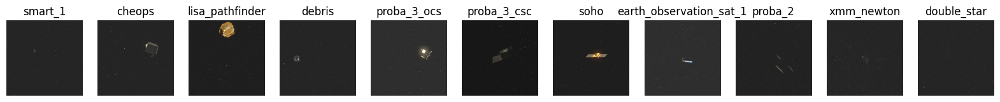

In [38]:
import pandas as pd
import os
from PIL import Image
import matplotlib.pyplot as plt


# Get unique classes
unique_classes = df_train_final['class'].unique()

# Define a dictionary to store sample images
sample_images = {}

# Iterate over unique classes
for class_name in unique_classes:
    # Filter DataFrame for images with the current class
    class_df = df_train_final[df_train_final['class'] == class_name]
    # Get the filename of the first image with the current class
    image_filename = class_df.iloc[0]['filename'] + '.jpg'
    # Load the image
    image_path = os.path.join(TRAIN_DIR, image_filename)
    image = Image.open(image_path)
    # Add the image to the dictionary
    sample_images[class_name] = image

# Display sample images
fig, axes = plt.subplots(1, len(unique_classes), figsize=(20, 5))
for i, (class_name, image) in enumerate(sample_images.items()):
    axes[i].imshow(image)
    axes[i].set_title(class_name)
    axes[i].axis('off')

plt.show()


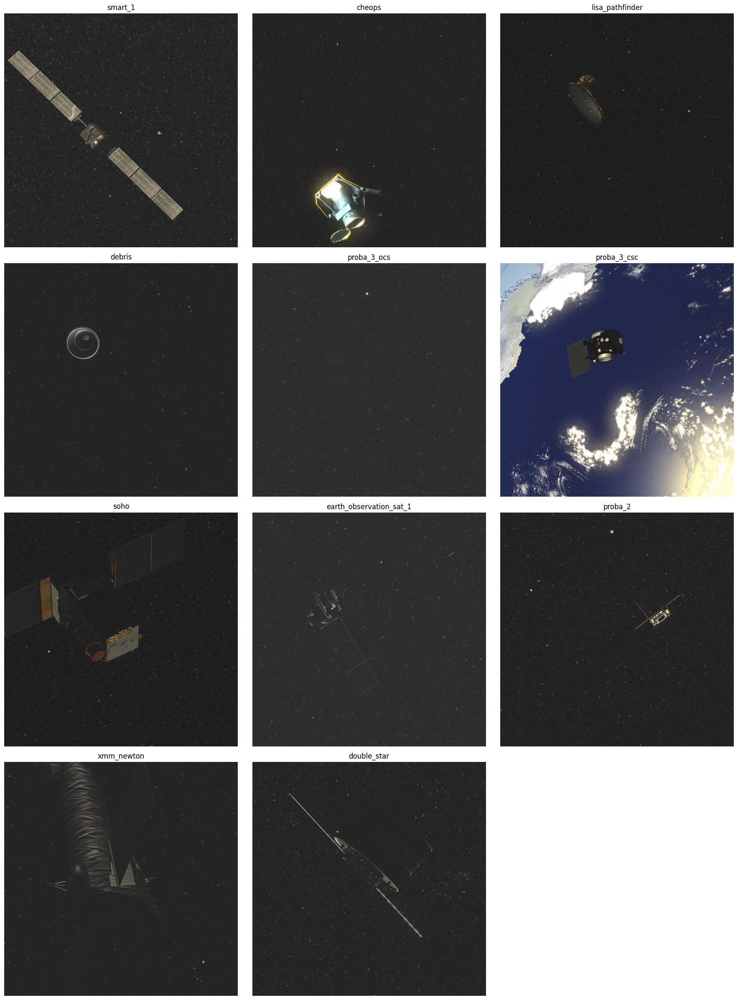

In [39]:
import pandas as pd
import os
from PIL import Image
import matplotlib.pyplot as plt


# Define a dictionary to store sample images
sample_images = {}

# Iterate over unique classes
for class_name in df_train_final['class'].unique():
    # Filter DataFrame for images with the current class
    class_df = df_train_final[df_train_final['class'] == class_name]
    # Get the filenames of the first three images with the current class
    image_filenames = [file + '.jpg' for file in class_df['filename'].head(3)]
    # Load the images
    images = [Image.open(os.path.join(TRAIN_DIR, filename)) for filename in image_filenames]
    # Add the images to the dictionary
    sample_images[class_name] = images

# Display sample images
num_classes = len(sample_images)
num_cols = 3
num_rows = num_classes // num_cols + (1 if num_classes % num_cols != 0 else 0)
fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 6, num_rows * 6))
for i, (class_name, images) in enumerate(sample_images.items()):
    row = i // num_cols
    col = i % num_cols
    for j, image in enumerate(images):
        axes[row, col].imshow(image)
        axes[row, col].set_title(class_name)
        axes[row, col].axis('off')

# Hide empty subplots
for i in range(len(sample_images), num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


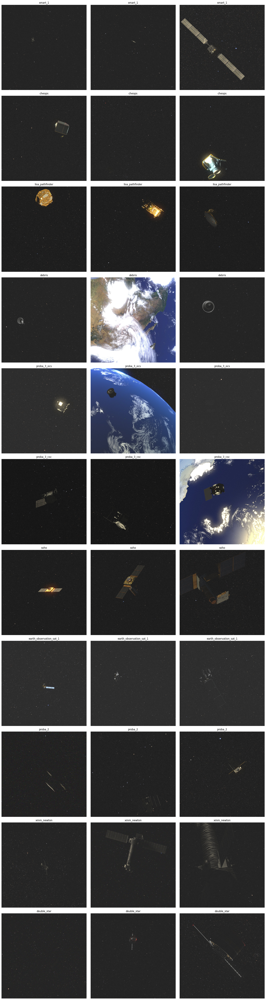

In [40]:
import pandas as pd
import os
from PIL import Image
import matplotlib.pyplot as plt

# Define a dictionary to store sample images
sample_images = {}

# Iterate over unique classes
for class_name in df_train_final['class'].unique():
    # Filter DataFrame for images with the current class
    class_df = df_train_final[df_train_final['class'] == class_name]
    # Get the filenames of the first three images with the current class
    image_filenames = [file + '.jpg' for file in class_df['filename'].head(3)]
    # Load the images
    images = [Image.open(os.path.join(TRAIN_DIR, filename)) for filename in image_filenames]
    # Add the images to the dictionary
    sample_images[class_name] = images

# Display sample images
num_classes = len(sample_images)
num_cols = 3
num_rows = num_classes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 6, num_rows * 6))
for i, (class_name, images) in enumerate(sample_images.items()):
    for j, image in enumerate(images):
        axes[i, j].imshow(image)
        axes[i, j].set_title(class_name)
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()


# Copying TRAIN Images

In [41]:
# import os
# import shutil

# image_files = [f for f in os.listdir(TRAIN_DIR) if os.path.isfile(os.path.join(TRAIN_DIR, f))]

# # Copy each image file to TEST_IMAGES_PATH
# for img_file in image_files:
#     src_path = os.path.join(TRAIN_DIR, img_file)
#     dst_path = os.path.join(TRAIN_IMAGES_PATH, img_file)
#     shutil.copyfile(src_path, dst_path)

# print("TRAIN Images copied successfully.")


In [42]:
# Function to count files in a directory
def count_files(directory):
    if not os.path.exists(directory):
        return 0
    return len(os.listdir(directory))

# Count files in each directory
train_labels_count = count_files(TRAIN_LABELS_PATH)
val_labels_count = count_files(VAL_LABELS_PATH)
train_images_count = count_files(TRAIN_IMAGES_PATH)
val_images_count = count_files(VAL_IMAGES_PATH)
test_images_count = count_files(TEST_IMAGES_PATH)

# Print the total number of files in each directory
print("Total number of files:")
print(f"TRAIN_LABELS_PATH: {train_labels_count} files")
print(f"VAL_LABELS_PATH: {val_labels_count} files")
print(f"TRAIN_IMAGES_PATH: {train_images_count} files")
print(f"VAL_IMAGES_PATH: {val_images_count} files")
print(f"TEST_IMAGES_PATH: {test_images_count} files")

Total number of files:
TRAIN_LABELS_PATH: 66000 files
VAL_LABELS_PATH: 22000 files
TRAIN_IMAGES_PATH: 0 files
VAL_IMAGES_PATH: 22000 files
TEST_IMAGES_PATH: 22000 files
